In [1]:
!python --version

Python 3.9.13


In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("data/Tweets.csv")

In [3]:
df.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


In [4]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [5]:
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(score)))

In [6]:
sentiment_analyzer_scores("The phone is super cool.")

The phone is super cool.---------------- {'neg': 0.0, 'neu': 0.326, 'pos': 0.674, 'compound': 0.7351}


In [7]:
sentiment_analyzer_scores("The phone is super bad.")

The phone is super bad.----------------- {'neg': 0.337, 'neu': 0.288, 'pos': 0.375, 'compound': 0.1027}


In [12]:
print(sentiment_analyzer_scores('☹️'))

☹️-------------------------------------- {'neg': 0.706, 'neu': 0.294, 'pos': 0.0, 'compound': -0.34}
None


In [23]:
print(sentiment_analyzer_scores('I`d have responded, if I were going'))
stat = analyser.polarity_scores('I`d have responded, if I were going')
print("type:", max(stat, key=stat.get))

I`d have responded, if I were going----- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
None
type: neu


In [39]:
a = analyser.polarity_scores("Sooo SAD I will miss you here in San Diego!!!")
print(a)
print(max(a, key = a.get))

{'neg': 0.441, 'neu': 0.559, 'pos': 0.0, 'compound': -0.7437}
neu


In [28]:
df["text"]

0                      I`d have responded, if I were going
1            Sooo SAD I will miss you here in San Diego!!!
2                                my boss is bullying me...
3                           what interview! leave me alone
4         Sons of ****, why couldn`t they put them on t...
                               ...                        
27476     wish we could come see u on Denver  husband l...
27477     I`ve wondered about rake to.  The client has ...
27478     Yay good for both of you. Enjoy the break - y...
27479                           But it was worth it  ****.
27480       All this flirting going on - The ATG smiles...
Name: text, Length: 27481, dtype: object

In [34]:
def sentiment_analyzer_label(sentence):
    if sentence != sentence:
        return "nan"
    stat = analyser.polarity_scores(sentence)
    return max(stat, key = stat.get)
df["sentiment_pred"] = df.apply(lambda sentence: sentiment_analyzer_label(sentence["text"]), axis=1)

In [35]:
df.head()

,textID,text,selected_text,sentiment,sentiment_pred
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,neu
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,neu
2,088c60f138,my boss is bullying me...,bullying me,negative,neu
3,9642c003ef,what interview! leave me alone,leave me alone,negative,neg
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,neu


In [37]:
for index, row in df.iterrows():
    if row["sentiment"][:3] != row["sentiment_pred"]:
        print(row)

textID                                                549e992a42
text               Sooo SAD I will miss you here in San Diego!!!
selected_text                                           Sooo SAD
sentiment                                               negative
sentiment_pred                                               neu
Name: 1, dtype: object
textID                           088c60f138
text              my boss is bullying me...
selected_text                   bullying me
sentiment                          negative
sentiment_pred                          neu
Name: 2, dtype: object
textID                                                   358bd9e861
text               Sons of ****, why couldn`t they put them on t...
selected_text                                         Sons of ****,
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 4, dtype: object
textID                                        

textID                                                   40d8340387
text               I gotta say, I feel bad for everyone in NKore...
selected_text                  , I feel bad for everyone in NKorea.
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 1860, dtype: object
textID                                             23d011cabb
text              _tastic Great  cant you twitter from there?
selected_text                                           Great
sentiment                                            positive
sentiment_pred                                       compound
Name: 1861, dtype: object
textID                                                   e8afba201a
text              Kinda feeling in a reggae mood.... hope you al...
selected_text     hope you all enjoy the smoothness on this love...
sentiment                                                  positive
sentiment_pred            

textID                                                   6dfe561162
text              get down tonight: http://bit.ly/QxXhi  the bri...
selected_text                 moms, bride & I rockin` the reception
sentiment                                                  positive
sentiment_pred                                                  neu
Name: 3401, dtype: object
textID                                                   836033d745
text              The parking meter computed 25 plus 25 is 40. I...
selected_text            And the 10 free minute button didn`t work.
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 3402, dtype: object
textID                                                   29926e73ba
text              Eating Which Wich, yumm! Dont think I`ve had i...
selected_text                                                 yumm!
sentiment                                                  posit

textID                                                   b973cfd48b
text               last reply  a scholar in US Homeland Security...
selected_text                                               y hated
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 4980, dtype: object
textID                                                   77528abf9c
text               Yeah, if I lived on the rez, I`d already be d...
selected_text     Yeah, if I lived on the rez, I`d already be dead.
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 4981, dtype: object
textID                                                   d4cced5f4c
text              Ahh ! I just woke up.  forgot to reset my alar...
selected_text                                                forgot
sentiment                                                  negat

textID                                                   0df38bf47a
text              uft im tutoring the lil sis  shes so cute, eve...
selected_text                                         shes so cute,
sentiment                                                  positive
sentiment_pred                                             compound
Name: 6484, dtype: object
textID                                                   4e8b4d99c1
text               wow thats impressive! luckily im not in rush ...
selected_text     wow thats impressive! luckily im not in rush b...
sentiment                                                   neutral
sentiment_pred                                             compound
Name: 6485, dtype: object
textID                                                  baec66304d
text              Sitting by myself. Everyone took the good seats.
selected_text                                                 good
sentiment                                                 positive


Name: 7999, dtype: object
textID                                                   d1ad18e2d6
text              Fender is hiding under the couch ... he knows ...
selected_text                               he isn`t happy about it
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 8000, dtype: object
textID                                                   8a9cc6366b
text              seriously my parents are non stop  minniapolis...
selected_text                                                i miss
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 8002, dtype: object
textID                                                   9ad738db4f
text              _d awww glad to know Little Sweet D and Leigh ...
selected_text     Little Sweet D and Leigh are doing good...than...
sentiment                             

textID                                c6149b7abf
text              its castiel!!!!  [ the angle ]
selected_text                      [ the angle ]
sentiment                               positive
sentiment_pred                               neu
Name: 9533, dtype: object
textID                                                   29dc42f844
text              I don`t feel so good after eating all that foo...
selected_text                               I don`t feel so good af
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 9535, dtype: object
textID                                  7c9c3f168a
text              I love crowded cars  and Ayanna!
selected_text                       I love crowded
sentiment                                 positive
sentiment_pred                            compound
Name: 9538, dtype: object
textID                                                   825b22b853
text          

textID                                                   d1bfbef7f2
text              asda ready meal - i don`t think i`ll ever be t...
selected_text               don`t think i`ll ever be the same again
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 11065, dtype: object
textID                                                   f82eb16f56
text               haha, def. That song is EPIC, have fun  i`m l...
selected_text                                  . That song is EPIC,
sentiment                                                  positive
sentiment_pred                                             compound
Name: 11067, dtype: object
textID                             ac7e3557ab
text              ugh. I totally can`t sleep.
selected_text     ugh. I totally can`t sleep.
sentiment                            negative
sentiment_pred                            neu
Name: 11068, dtype: object
textID   

textID                                                   05d973f42d
text              I am back from my weekend getaway! Energized f...
selected_text                           Energized for another week,
sentiment                                                  positive
sentiment_pred                                             compound
Name: 12608, dtype: object
textID                                0fe63f7521
text              missed my friggin hair appt!!!
selected_text             missed my friggin hair
sentiment                               negative
sentiment_pred                               neu
Name: 12610, dtype: object
textID                                             2bf08a606a
text              This is a joke surely? http://prune.it/WEAt
selected_text                          This is a joke surely?
sentiment                                             neutral
sentiment_pred                                       compound
Name: 12615, dtype: object
textID                  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



textID                                                   9d63309e7c
text              So bummed that I can`t see LTJ in June  hoping...
selected_text                                                bummed
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 24920, dtype: object
textID                                                   3ba3765073
text               It`s a lie just like the restaraunt named 'Ga...
selected_text                                                   lie
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 24921, dtype: object
textID                                 6d09c8576b
text              My TI89 died. I don`t know why.
selected_text                       My TI89 died.
sentiment                                negative
sentiment_pred                                neu
Name: 24927, dty

textID                                                   c939514b1b
text               I have a FACEBOOK but I use MYSPACE and TWITT...
selected_text                                                hardly
sentiment                                                  negative
sentiment_pred                                                  neu
Name: 26458, dtype: object
textID                                                635fce8da9
text               Interesting... I never get to Etown, however.
selected_text                                       Interesting.
sentiment                                               positive
sentiment_pred                                               neu
Name: 26460, dtype: object
textID                                                   8073b256f8
text              hollie steel  bless her. but go dreambears <33...
selected_text                       go dreambears <33333 hahahahaha
sentiment                                                  positive
sentiment

In [48]:
a = analyser.polarity_scores(" Sooo SAD I will miss you here in San Diego!!!")
print(a)
print(max(a, key = a.get))

{'neg': 0.441, 'neu': 0.559, 'pos': 0.0, 'compound': -0.7437}
neu


In [56]:
def sentiment_score(sentence):
    sid_obj = SentimentIntensityAnalyzer()
    if sentence != sentence:
        return "nan"
    sentence_dict = sid_obj.polarity_scores(sentence)
    if sentence_dict["compound"] >= 0.5:
        return "pos"
    elif sentence_dict["compound"] <= - 0.05:
        return "neg"
    else:
        return "neu"

In [57]:
df["sentiment_pred_1"] = df.apply(lambda sentence: sentiment_score(sentence["text"]), axis=1)

In [59]:
for index, row in df.iterrows():
    if row["sentiment"][:3] != row["sentiment_pred_1"]:
        print(row)

textID                                                     358bd9e861
text                 Sons of ****, why couldn`t they put them on t...
selected_text                                           Sons of ****,
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 4, dtype: object
textID                                                     2339a9b08b
text                 as much as i love to be hopeful, i reckon the...
selected_text       as much as i love to be hopeful, i reckon the ...
sentiment                                                     neutral
sentiment_pred                                               compound
sentiment_pred_1                                                  pos
Name: 10, dtype: object
textID                         8a939bfb59
text                Uh oh, I am sunburned
selected_text       Uh oh, I 

textID                                                     0a3db03798
text                Another Lake Park kid is going to Tulane. I`m ...
selected_text       Another Lake Park kid is going to Tulane. I`m ...
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 2370, dtype: object
textID                                                     300ee64c61
text                 Welcome to Glasgow Felix, sorry I cant be the...
selected_text                         , sorry I cant be there tonight
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 2371, dtype: object
textID                                                     a4107cd765
text                 Im not getting an

textID                                                     1de5cfa298
text                _mills  better than a spider or some type if A...
selected_text                                                  better
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 4498, dtype: object
textID                                                     f1f588a9bb
text                 awww ) where`d you get that? hugh is so thin....
selected_text       awww ) where`d you get that? hugh is so thin. ...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
Name: 4505, dtype: object
textID                                  67ff1acc4f
text                 trivia? Working, no computer!
select

textID                                                     e05668719a
text                 i feel u  but its sooo close to me hard not t...
selected_text       i feel u  but its sooo close to me hard not to...
sentiment                                                    negative
sentiment_pred                                               compound
sentiment_pred_1                                                  pos
Name: 6627, dtype: object
textID                                                     1c6be5f128
text                 Cant wait && Cant wait to see the 3d concert ...
selected_text                         Cant wait to see the 3d concert
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 6629, dtype: object
textID                                                     9d9f984b7d
text                 so i feel like **

textID                                                     85c58f9bbd
text                walking the dog on horseforth park, no hangove...
selected_text                                                   yay!!
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 8852, dtype: object
textID                                                     5bfd6f9f8d
text                endless set list... very long... grueling almo...
selected_text       endless set list... very long... grueling almo...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
Name: 8854, dtype: object
textID                              6f8e8e8bfc
text                 omg man  i`ll pray for ya
selected_text 

textID                                                     d533aece71
text                 He`s my boxing trainer. Although I think the ...
selected_text                                                 hitting
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 10880, dtype: object
textID                                 a6ca21f8bc
text                Sooo much work so little time
selected_text       Sooo much work so little time
sentiment                                negative
sentiment_pred                                neu
sentiment_pred_1                              neu
Name: 10887, dtype: object
textID                                                     3e4b17c28b
text                  also check out  and   2 other wonderful caus...
selected_text       also check out  and   2 other wonderful causes...
sentiment       

textID              daaac85146
text                    Awww!!
selected_text           Awww!!
sentiment             positive
sentiment_pred             neu
sentiment_pred_1           neu
Name: 13117, dtype: object
textID                                                     e3f4309bb2
text                 We`re English (well in parts), it`s Weather, ...
selected_text       We`re English (well in parts), it`s Weather, i...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
Name: 13120, dtype: object
textID                                                     7e3753c9f1
text                The bunuelos were a huge hit but i had to skip...
selected_text       The bunuelos were a huge hit but i had to skip...
sentiment                                                     neutral
sentiment_pred                                              

textID                          28fbee3d08
text                Please don`t forget us
selected_text                       forget
sentiment                         negative
sentiment_pred                         pos
sentiment_pred_1                       neu
Name: 15183, dtype: object
textID                                                     6518260f62
text                 If it doesn`t work out drop me a line. I woul...
selected_text                                            love to talk
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
Name: 15185, dtype: object
textID                                                     9d190cc1cc
text                 i had a blast at the sale today! had one pair...
selected_text                                             had a blast
sentiment                                                 

textID                           be65765553
text                 Yeah, tried it. No go.
selected_text                         tried
sentiment                          negative
sentiment_pred                          neu
sentiment_pred_1                        neu
Name: 17248, dtype: object
textID                                      61e627b910
text                 I thought I was your best friend?
selected_text        I thought I was your best friend?
sentiment                                      neutral
sentiment_pred                                compound
sentiment_pred_1                                   pos
Name: 17252, dtype: object
textID                                                     5ca8590956
text                i look like a freaking tomato  goin to graduat...
selected_text       i look like a freaking tomato  goin to graduat...
sentiment                                                     neutral
sentiment_pred                                                    neu
se

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [52]:
def sentiment_scores(sentence):
 
    # Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()
 
    # polarity_scores method of SentimentIntensityAnalyzer
    # object gives a sentiment dictionary.
    # which contains pos, neg, neu, and compound scores.
    sentiment_dict = sid_obj.polarity_scores(sentence)
     
    print("Overall sentiment dictionary is : ", sentiment_dict)
    print("sentence was rated as ", sentiment_dict['neg']*100, "% Negative")
    print("sentence was rated as ", sentiment_dict['neu']*100, "% Neutral")
    print("sentence was rated as ", sentiment_dict['pos']*100, "% Positive")
 
    print("Sentence Overall Rated As", end = " ")
 
    # decide sentiment as positive, negative and neutral
    if sentiment_dict['compound'] >= 0.05 :
        print("Positive")
 
    elif sentiment_dict['compound'] <= - 0.05 :
        print("Negative")
 
    else :
        print("Neutral")


In [64]:
sentiment_scores("Sooo SAD")

Overall sentiment dictionary is :  {'neg': 0.793, 'neu': 0.207, 'pos': 0.0, 'compound': -0.5904}
sentence was rated as  79.3 % Negative
sentence was rated as  20.7 % Neutral
sentence was rated as  0.0 % Positive
Sentence Overall Rated As Negative


In [61]:
sid_obj = SentimentIntensityAnalyzer()
def sentiment_score(sentence):
    if sentence != sentence:
        return ""
    sentence_dict = sid_obj.polarity_scores(sentence)
    if sentence_dict["compound"] >= 0.5:
        return "pos"
    elif sentence_dict["compound"] <= - 0.05:
        return "neg"
    else:
        return "neu"
    
df["sentiment_pred_2"] = df.apply(lambda sentence: sentiment_score(sentence["text"]), axis=1)

for index, row in df.iterrows():
    if row["sentiment"][:3] != row["sentiment_pred_2"]:
        print(row)

textID                                                     358bd9e861
text                 Sons of ****, why couldn`t they put them on t...
selected_text                                           Sons of ****,
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
Name: 4, dtype: object
textID                                                     2339a9b08b
text                 as much as i love to be hopeful, i reckon the...
selected_text       as much as i love to be hopeful, i reckon the ...
sentiment                                                     neutral
sentiment_pred                                               compound
sentiment_pred_1                                                  pos
sentiment_pred_2                                                  p

textID                                                    752bed813d
text                Im had to leave early to go to piccolo practice.
selected_text       Im had to leave early to go to piccolo practice.
sentiment                                                    neutral
sentiment_pred                                                   neu
sentiment_pred_1                                                 neg
sentiment_pred_2                                                 neg
Name: 2022, dtype: object
textID                                 e1975adfee
text                 I know, thx  But I`ll be ok.
selected_text                                 thx
sentiment                                positive
sentiment_pred                                neu
sentiment_pred_1                              neu
sentiment_pred_2                              neu
Name: 2029, dtype: object
textID                                                     7479c985ae
text                Just discovered a painful

textID              dd347b56a1
text                  nice one
selected_text         nice one
sentiment             positive
sentiment_pred             pos
sentiment_pred_1           neu
sentiment_pred_2           neu
Name: 4054, dtype: object
textID                                                     e86275435d
text                 i`m sorry but LOL! what is this about? waitt....
selected_text       i`m sorry but LOL! what is this about? waitt.....
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  pos
sentiment_pred_2                                                  pos
Name: 4057, dtype: object
textID                                                     88851663d2
text                 hey you ****!! that`s kinda mean dont yu think?!
selected_text        hey you ****!! that`s kinda mean dont yu think?!
sentiment                      

textID                                                     43441faed9
text                is planning her week, its going to good, going...
selected_text                                                   good,
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
Name: 6150, dtype: object
textID                                                     ceee072314
text                home from STING..crunk (of course)..long **** ...
selected_text                     all is good..happy mother`s day!!..
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                

textID                                                     ea09fd8a70
text                is feeling her eyes burned-fried after 10 hour...
selected_text                                                burned-f
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
Name: 8282, dtype: object
textID                                                     93928b7533
text                Rose Romance is released here on Thursday, gon...
selected_text       Rose Romance is released here on Thursday, gon...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  pos
sentiment_pred_2                                                

textID                                           25c67600c0
text                goodbyeeee Arizona. See you in 3 weeks.
selected_text                                    goodbyeeee
sentiment                                          negative
sentiment_pred                                          neu
sentiment_pred_1                                        neu
sentiment_pred_2                                        neu
Name: 10301, dtype: object
textID                                                     140fdbee8b
text                ugh, i was so hungry i scarfed my lunch before...
selected_text       ugh, i was so hungry i scarfed my lunch before...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                  neg
Name: 10304, dtype: object
textID                              

textID                                                     5ea2756596
text                Bought some little plastic personal wine bottl...
selected_text       Bought some little plastic personal wine bottl...
sentiment                                                     neutral
sentiment_pred                                               compound
sentiment_pred_1                                                  pos
sentiment_pred_2                                                  pos
Name: 12495, dtype: object
textID                                                     9a718addd2
text                Had a nice pre mother`s day dinner out. Now a ...
selected_text                 Had a nice pre mother`s day dinner out.
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                               

textID                                                11370b4eed
text                its my birthday.....happy birthday to me!!!!
selected_text                           happy birthday to me!!!!
sentiment                                               positive
sentiment_pred                                               neu
sentiment_pred_1                                             neu
sentiment_pred_2                                             neu
Name: 14499, dtype: object
textID                         297cfb8e0f
text                 i wish i was outside
selected_text        i wish i was outside
sentiment                        positive
sentiment_pred                        neu
sentiment_pred_1                      neu
sentiment_pred_2                      neu
Name: 14500, dtype: object
textID                                                     3e04dbc3b2
text                Anybody have advice on who to use for printing...
selected_text       Anybody have advice on who to use for

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Stemming and Lemmatization

In [77]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def preprocessed_text(sentence):
    if sentence != sentence:
        return ""
    
    tokens = word_tokenize(sentence.lower())
    
    filtered_tokens = [token for token in tokens if token not in stopwords.words("english")]
    
    #lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    
    processed_text = " ".join(lemmatized_tokens)
    
    return processed_text

In [81]:
df["processed_text"] = df["text"].apply(preprocessed_text)

In [79]:
df.head()

,textID,text,selected_text,sentiment,sentiment_pred,sentiment_pred_1,sentiment_pred_2,processed_text
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,neu,neu,neu,"` responded , going"
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,neu,neg,neg,sooo sad miss san diego ! ! !
2,088c60f138,my boss is bullying me...,bullying me,negative,neu,neg,neg,bos bullying ...
3,9642c003ef,what interview! leave me alone,leave me alone,negative,neg,neg,neg,interview ! leave alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,neu,neu,neu,"son * * * * , ` put release already bought"


In [82]:
#difference between original and with lemmatization
df["sentiment_pred_3"] = df.apply(lambda sentence: sentiment_score(sentence["processed_text"]), axis=1)

for index, row in df.iterrows():
    if row["sentiment"][:3] != row["sentiment_pred_3"]:
        print(row)

textID                                                     358bd9e861
text                 Sons of ****, why couldn`t they put them on t...
selected_text                                           Sons of ****,
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
processed_text             son * * * * , ` put release already bought
sentiment_pred_3                                                  neu
Name: 4, dtype: object
textID                                                     2339a9b08b
text                 as much as i love to be hopeful, i reckon the...
selected_text       as much as i love to be hopeful, i reckon the ...
sentiment                                                     neutral
sentiment_pred                                               compou

textID                                                     b31486f8c0
text                How did Day 26 go from a good budget video (im...
selected_text                                 such a low budget video
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
processed_text      day 26 go good budget video ( imma put ) low b...
sentiment_pred_3                                                  neu
Name: 1944, dtype: object
textID                                                     ff85b0b80a
text                 I think you and Tamera should have your own s...
selected_text           fam is not appreciating you like they should.
sentiment                                                    negative
sentiment_pred                                                  

textID                   63aedbe9fe
text                Goooooodmorning
selected_text       Goooooodmorning
sentiment                  positive
sentiment_pred                  neu
sentiment_pred_1                neu
sentiment_pred_2                neu
processed_text      goooooodmorning
sentiment_pred_3                neu
Name: 3882, dtype: object
textID                                                     137e007908
text                  My dog Nemo cause he wimpers every morning w...
selected_text       My dog Nemo cause he wimpers every morning whe...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                  neg
processed_text             dog nemo cause wimpers every morning leave
sentiment_pred_3                                                  neg
Name: 3884, dtype: o

textID                                        1fbb7596da
text                Castiel is loveeeeeeeeeeeeeeeeeeeeee
selected_text                  loveeeeeeeeeeeeeeeeeeeeee
sentiment                                       positive
sentiment_pred                                       neu
sentiment_pred_1                                     neu
sentiment_pred_2                                     neu
processed_text         castiel loveeeeeeeeeeeeeeeeeeeeee
sentiment_pred_3                                     neu
Name: 5932, dtype: object
textID                                                     12b846508c
text                 i knowwww.. i cant deal. this 9-5 life is not...
selected_text                                            i cant deal.
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                         

textID                                                     8bbd0eb29e
text                2 hours after teleconference. but can`t go bac...
selected_text                             but can`t go back to sleep.
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
processed_text      2 hour teleconference . ` go back sleep . got ...
sentiment_pred_3                                                  neu
Name: 7936, dtype: object
textID                                                     df7dfc80bb
text                 Oh, okay. Every so often I get this random ta...
selected_text       Oh, okay. Every so often I get this random tas...
sentiment                                                     neutral
sentiment_pred                                                  

textID                                                     95307ec44e
text                Just saw 'Drag me to Hell'. Sam Ramei is excel...
selected_text       Sam Ramei is excellant as usual but the kitty ...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                  neg
processed_text      saw 'drag hell ' . sam ramei excellant usual k...
sentiment_pred_3                                                  neg
Name: 9967, dtype: object
textID                             76bfb9161f
text                 mother is hogging the TV
selected_text        mother is hogging the TV
sentiment                            negative
sentiment_pred                            neu
sentiment_pred_1                          neu
sentiment_pred_2                          neu
processed_text        

textID                                                     182a1c6ffd
text                  we are at FOrt Belvoir, on base.  Hubs is st...
selected_text                                    s!!  I just looooove
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
processed_text      fort belvoir , base . hub stationed pentagon ....
sentiment_pred_3                                                  neu
Name: 11980, dtype: object
textID                                         cf8dcb4bcb
text                 Thank you so much for the Retweet  x
selected_text                           Thank you so much
sentiment                                        positive
sentiment_pred                                        neu
sentiment_pred_1                                     

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [83]:
#difference between without and with lemmatization
for index, row in df.iterrows():
    if row["sentiment_pred_2"] != row["sentiment_pred_3"]:
        print(row)

textID                                                     d33f811375
text                I`m going home now. Have you seen my new twitt...
selected_text                                       Quite....heavenly
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
processed_text      ` going home . seen new twitter design ? quite...
sentiment_pred_3                                                  pos
Name: 30, dtype: object
textID                                                     d93afa85cf
text                 Car not happy, big big dent in boot! Hoping t...
selected_text       Car not happy, big big dent in boot! Hoping th...
sentiment                                                     neutral
sentiment_pred                                                    

textID                           0cd3ccb71b
text                ahhhh now i have no pic
selected_text       ahhhh now i have no pic
sentiment                           neutral
sentiment_pred                          neu
sentiment_pred_1                        neg
sentiment_pred_2                        neg
processed_text                    ahhhh pic
sentiment_pred_3                        neu
Name: 3436, dtype: object
textID                                                     35124a7481
text                 It`s been fine for me for like, a week, but n...
selected_text       It`s been fine for me for like, a week, but no...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neu
sentiment_pred_2                                                  neu
processed_text                          ` fine like , week , ` load .
sentiment_pred_3  

textID                                                     13341ce982
text                 http://twitpic.com/4vp3x - *swoon* Nick looks...
selected_text       http://twitpic.com/4vp3x - *swoon* Nick looks ...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  pos
sentiment_pred_2                                                  pos
processed_text      http : //twitpic.com/4vp3x - * swoon * nick lo...
sentiment_pred_3                                                  neu
Name: 7268, dtype: object
textID                                                     92e8199331
text                Ugh..just starting another 2 hours of behind t...
selected_text                                                   Ugh..
sentiment                                                    negative
sentiment_pred                                                  

textID                       b6a7e120db
text                    hope all is ok.
selected_text            hope all is ok
sentiment                      positive
sentiment_pred                      neu
sentiment_pred_1                    neu
sentiment_pred_2                    neu
processed_text                hope ok .
sentiment_pred_3                    pos
Name: 10786, dtype: object
textID                                                     8375414682
text                 still a bit of a warning signal in my head sa...
selected_text              still a bit of a warning signal in my head
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                  neg
processed_text      still bit warning signal head saying : 'you wa...
sentiment_pred_3                                     

textID                                                     0d5009477c
text                45Th st pub anyone tonight? Dont want to be a ...
selected_text                  Dont want to be a lonely drunk tonight
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                  neg
processed_text      45th st pub anyone tonight ? dont want lonely ...
sentiment_pred_3                                                  neu
Name: 14604, dtype: object
textID                                                     2575e76393
text                 If I knew it was gonna be this kind of party,...
selected_text       If I knew it was gonna be this kind of party, ...
sentiment                                                    negative
sentiment_pred                                                 

textID                                       c8611b620b
text                Last day at work...Sick to the bone
selected_text                          Sick to the bone
sentiment                                      negative
sentiment_pred                                      neu
sentiment_pred_1                                    neu
sentiment_pred_2                                    neu
processed_text              last day work ... sick bone
sentiment_pred_3                                    neg
Name: 18432, dtype: object
textID                                                     43babbe3e0
text                 you were right about karla not the best movie...
selected_text       you were right about karla not the best movie ...
sentiment                                                     neutral
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                 

textID                                                     4e6e3ebb75
text                just got home.  errrr... V.Luna hospital is so...
selected_text                                                 so far.
sentiment                                                    negative
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                                  neg
processed_text         got home . errrr ... v.luna hospital far . : |
sentiment_pred_3                                                  neu
Name: 22258, dtype: object
textID                                                     63c37a49f7
text                Hello twitting world!  We are off to best budd...
selected_text                                                    best
sentiment                                                    positive
sentiment_pred                                                 

textID                                       99ce4e68b9
text                ohhhh, how sad...I didnï¿½t get it!
selected_text                                     sad..
sentiment                                      negative
sentiment_pred                                      neu
sentiment_pred_1                                    neu
sentiment_pred_2                                    neu
processed_text           ohhhh , sad ... didnï¿½t get !
sentiment_pred_3                                    neg
Name: 26054, dtype: object
textID                                                     c91f01a8b3
text                 - my son plays pitcher and catcher.  Beautifu...
selected_text                                               Beautiful
sentiment                                                    positive
sentiment_pred                                                    neu
sentiment_pred_1                                                  neg
sentiment_pred_2                                 

In [91]:
def get_binary_target(sa_target):
    return 1 if sa_target[:3] == "pos" else 0
df["sentiment_binary"] = df.apply(lambda x: get_binary_target(x["sentiment"]), axis=1)
df["sentiment_pred_binary"] = df.apply(lambda x: get_binary_target(x["sentiment_pred_2"]), axis=1)

#confusion matrix to check the accuracy of the model
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

print(confusion_matrix(df["sentiment_binary"], df["sentiment_pred_binary"]))

[[16511  2388]
 [ 2989  5593]]


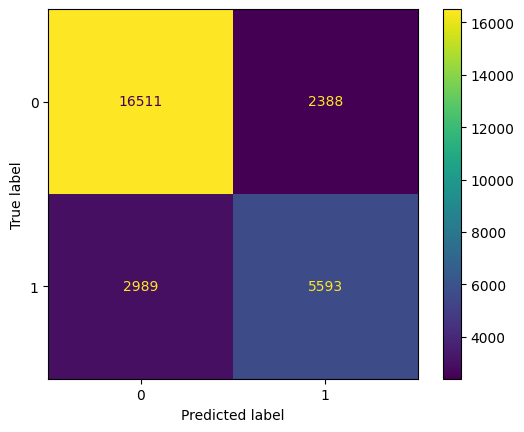

In [94]:
cm = confusion_matrix(df["sentiment_binary"], df["sentiment_pred_binary"])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
#difference with defualt and VADER

In [97]:
from sklearn.metrics import classification_report

print(classification_report(df["sentiment_binary"], df["sentiment_pred_binary"]))

              precision    recall  f1-score   support

           0       0.85      0.87      0.86     18899
           1       0.70      0.65      0.68      8582

    accuracy                           0.80     27481
   macro avg       0.77      0.76      0.77     27481
weighted avg       0.80      0.80      0.80     27481



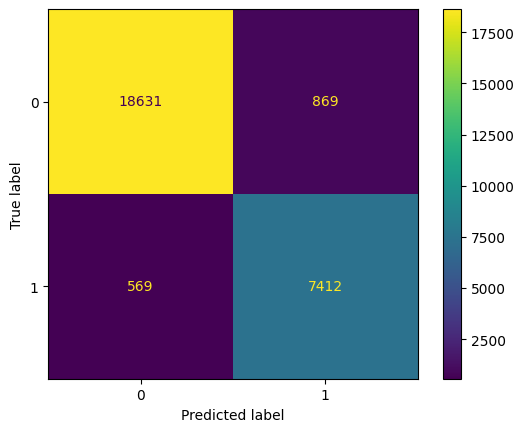

In [95]:
df["sentiment_pred_binary_3"] = df.apply(lambda x: get_binary_target(x["sentiment_pred_3"]), axis=1)

cm = confusion_matrix(df["sentiment_pred_binary"], df["sentiment_pred_binary_3"])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
#difference with VADER and VADER+lemmatization

In [96]:
from sklearn.metrics import classification_report

print(classification_report(df["sentiment_pred_binary"], df["sentiment_pred_binary_3"]))

              precision    recall  f1-score   support

           0       0.97      0.96      0.96     19500
           1       0.90      0.93      0.91      7981

    accuracy                           0.95     27481
   macro avg       0.93      0.94      0.94     27481
weighted avg       0.95      0.95      0.95     27481



In [113]:
from nltk.stem import WordNetLemmatizer
import re
# Initialize wordnet lemmatizer
wnl = WordNetLemmatizer()

#change sentences to list to perform lemmatizer
sentence_endings = r"[?! ]"

df["sentence_list"] = df.apply(lambda row: re.split(sentence_endings, row["text"]) if row["text"] == row["text"] else "", axis =1)

#perform lemmatizer
def lemmatize_list_to_string(string_list):
    lemmatize_string = ""
    for string in string_list:
        lemmatize_string += (wnl.lemmatize(string, pos = "v") + " ")
    return lemmatize_string

df["lemma_text"] = df.apply(lambda row: lemmatize_list_to_string(row["sentence_list"]), axis=1)
# print("{0:20}{1:20}".format("--Word--", "--Lemma--"))
# for word in example_words:
#     print("{0:20}{1:20}".format(word, wnl.lemmatize(word, pos = "v")))
#print(wnl.lemmatize("programming programmer program", pos = "v"))

In [117]:
df.head()

,textID,text,selected_text,sentiment,sentiment_pred,sentiment_pred_1,sentiment_pred_2,processed_text,sentiment_pred_3,sentiment_binary,sentiment_pred_binary,sentiment_pred_binary_3,sentence_list,lemma_text,sentiment_pred_wnl,sentiment_pred_binary_wnl
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,neu,neu,neu,"` responded , going",neu,0,0,0,"[, I`d, have, responded,, if, I, were, going]","I`d have responded, if I were going",neu,0
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,neu,neg,neg,sooo sad miss san diego ! ! !,neg,0,0,0,"[, Sooo, SAD, I, will, miss, you, here, in, Sa...",Sooo SAD I will miss you here in San Diego,neg,0
2,088c60f138,my boss is bullying me...,bullying me,negative,neu,neg,neg,bos bullying ...,neg,0,0,0,"[my, boss, is, bullying, me...]",my bos is bullying me...,neg,0
3,9642c003ef,what interview! leave me alone,leave me alone,negative,neg,neg,neg,interview ! leave alone,neg,0,0,0,"[, what, interview, , leave, me, alone]",what interview leave me alone,neg,0
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,neu,neu,neu,"son * * * * , ` put release already bought",neu,0,0,0,"[, Sons, of, ****,, why, couldn`t, they, put, ...","Sons of ****, why couldn`t they put them on t...",neu,0


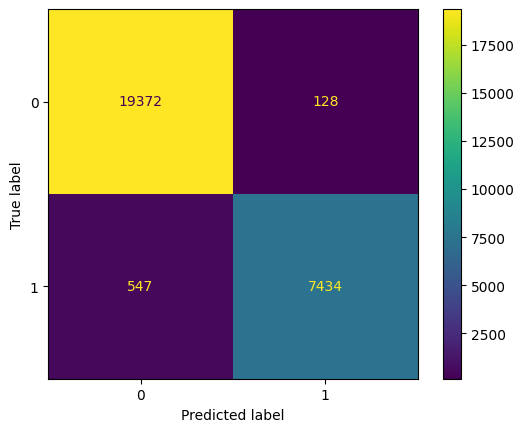

In [116]:
#difference between original and with lemmatization
df["sentiment_pred_wnl"] = df.apply(lambda sentence: sentiment_score(sentence["lemma_text"]), axis=1)

# for index, row in df.iterrows():
#     if row["sentiment"][:3] != row["sentiment_pred_wnl"]:
#         print(row)

df["sentiment_pred_binary_wnl"] = df.apply(lambda x: get_binary_target(x["sentiment_pred_wnl"]), axis=1)

cm = confusion_matrix(df["sentiment_pred_binary"], df["sentiment_pred_binary_wnl"])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
#difference with VADER and VADER+ WordNetLemmatizer lemmatization

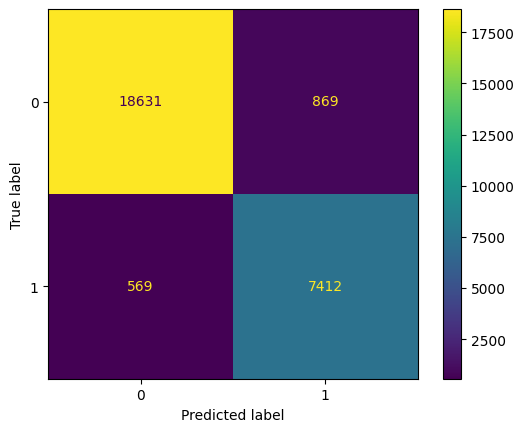

In [114]:
disp.plot()

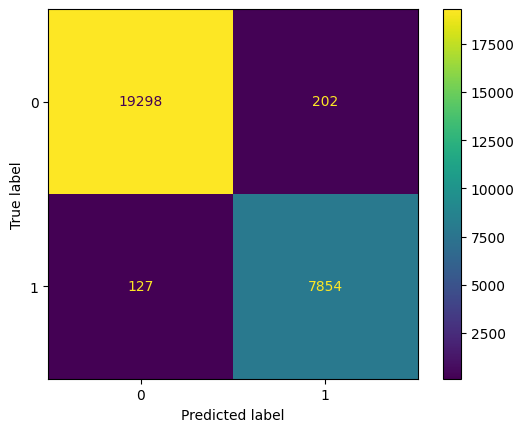

In [119]:
#change sentences to list to perform lemmatizer
space = r"\s+"
df["sentence_list_2"] = df.apply(lambda row: re.split(space, row["text"]) if row["text"] == row["text"] else "", axis =1)

#perform lemmatizer
def lemmatize_list_to_string_2(string_list):
    lemmatize_string = ""
    for string in string_list:
        lemmatize_string += (wnl.lemmatize(string, pos = "v") + " ")
    return lemmatize_string

df["lemma_text_2"] = df.apply(lambda row: lemmatize_list_to_string_2(row["sentence_list_2"]), axis=1)

#difference between original and with lemmatization
df["sentiment_pred_wnl_2"] = df.apply(lambda sentence: sentiment_score(sentence["lemma_text_2"]), axis=1)

df["sentiment_pred_binary_wnl_2"] = df.apply(lambda x: get_binary_target(x["sentiment_pred_wnl_2"]), axis=1)

cm = confusion_matrix(df["sentiment_pred_binary"], df["sentiment_pred_binary_wnl_2"])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [120]:
df.head()

,textID,text,selected_text,sentiment,sentiment_pred,sentiment_pred_1,sentiment_pred_2,processed_text,sentiment_pred_3,sentiment_binary,sentiment_pred_binary,sentiment_pred_binary_3,sentence_list,lemma_text,sentiment_pred_wnl,sentiment_pred_binary_wnl,sentence_list_2,lemma_text_2,sentiment_pred_wnl_2,sentiment_pred_binary_wnl_2
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,neu,neu,neu,"` responded , going",neu,0,0,0,"[, I`d, have, responded,, if, I, were, going]","I`d have responded, if I were going",neu,0,"[, I`d, have, responded,, if, I, were, going]","I`d have responded, if I be go",neu,0
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,neu,neg,neg,sooo sad miss san diego ! ! !,neg,0,0,0,"[, Sooo, SAD, I, will, miss, you, here, in, Sa...",Sooo SAD I will miss you here in San Diego,neg,0,"[, Sooo, SAD, I, will, miss, you, here, in, Sa...",Sooo SAD I will miss you here in San Diego!!!,neg,0
2,088c60f138,my boss is bullying me...,bullying me,negative,neu,neg,neg,bos bullying ...,neg,0,0,0,"[my, boss, is, bullying, me...]",my bos is bullying me...,neg,0,"[my, boss, is, bullying, me...]",my boss be bully me...,neg,0
3,9642c003ef,what interview! leave me alone,leave me alone,negative,neg,neg,neg,interview ! leave alone,neg,0,0,0,"[, what, interview, , leave, me, alone]",what interview leave me alone,neg,0,"[, what, interview!, leave, me, alone]",what interview! leave me alone,neg,0
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,neu,neu,neu,"son * * * * , ` put release already bought",neu,0,0,0,"[, Sons, of, ****,, why, couldn`t, they, put, ...","Sons of ****, why couldn`t they put them on t...",neu,0,"[, Sons, of, ****,, why, couldn`t, they, put, ...","Sons of ****, why couldn`t they put them on t...",neu,0


In [98]:
#stemming
from nltk.stem import PorterStemmer
ps = PorterStemmer()

# Bag of Words (BoW) Model